In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import time
import collections
import random
import pandas as pd
import datetime
import scipy as sci
from scipy.integrate import odeint
from scipy.integrate import solve_ivp
import torch

print(sci.__version__)

1.7.3


In [2]:
r0=2
v0=2

lambda1 =  2.689E-01
lambda2 = 1.450E-02
lambda3 = -3.991E-01
lambda4 = 1.939E-01
power1 = 1.552E-01
power2 = 7.777E-02
power3 = 2.298E-01


def infer_x(s,i,j):
    x1=s[i]  #self
    y1=s[i+n]  #self
    x2=s[j]
    y2=s[j+n]
    dist=((x1-x2)**2 + (y1-y2)**2)**(1/2)

    return (x1-x2)/dist*(lambda1*(dist**power1)+lambda2*(dist**power2)+lambda3*(dist**power3)\
                         +lambda4)


def infer_y(s,i,j):
    x1=s[i]  #self
    y1=s[i+n]  #self
    x2=s[j]
    y2=s[j+n]
    dist=((x1-x2)**2 + (y2-y1)**2)**(1/2)

    return (y1-y2)/dist*(lambda1*(dist**power1)+lambda2*(dist**power2)+lambda3*(dist**power3)\
                         +lambda4)


def total_infer_x(s,i):
    others_index=list(range(n))
    others_index.remove(i)
    total_interaction_x=sum([infer_x(s,i,j) for j in others_index])
    v_i_x=s[2*n+i]
    v_i_y=s[3*n+i]
    v_i_mag = (v_i_x**2+v_i_y**2)**(1/2)
    self_propel_x = 1*(v_i_x/v_i_mag)*(v0-v_i_mag)

    return self_propel_x+total_interaction_x

def total_infer_y(s,i):
    others_index=list(range(n))
    others_index.remove(i)
    total_interaction_y=sum([infer_y(s,i,j) for j in others_index])
    v_i_x=s[2*n+i]
    v_i_y=s[3*n+i]
    v_i_mag = (v_i_x**2+v_i_y**2)**(1/2)
    self_propel_y = 1*(v_i_y/v_i_mag)*(v0-v_i_mag)

    return self_propel_y+total_interaction_y

def F_infer_ivp(t,s):
    return np.concatenate((s[2*n:3*n],s[3*n:4*n],\
                           [total_infer_x(s,i) for i in range(n)]+np.random.normal(0,1,size=n),\
                           [total_infer_y(s,i) for i in range(n)]+np.random.normal(0,1,size=n)))


In [3]:
##########  Inital condition  ##########

position_list_x=[]
position_list_y=[]
velocity_list_x=[]
velocity_list_y=[]

random.seed(101)

for i in range(40):
    position_list_x.append(random.uniform(-1.0,1.0))
    position_list_y.append(random.uniform(-1.0,1.0))
    velocity_list_x.append(random.uniform(-1.0,1.0))
    velocity_list_y.append(random.uniform(-1.0,1.0))



eps = torch.finfo(torch.float32).eps

nodes_G = torch.tensor([position_list_x, position_list_y, velocity_list_x, velocity_list_y], dtype=torch.float32)
nodes_np=nodes_G.to('cpu').detach().numpy()

s0=nodes_np.reshape(-1)
n=nodes_np.shape[1]

In [4]:
dt=0.1
T=200
t=np.arange(0,T+dt,dt)

solution=solve_ivp(F_infer_ivp,[0,T],s0, method='RK45', max_step=0.01, t_eval=t)

print(solution)

  message: 'The solver successfully reached the end of the integration interval.'
     nfev: 1014530
     njev: 0
      nlu: 0
      sol: None
   status: 0
  success: True
        t: array([0.000e+00, 1.000e-01, 2.000e-01, ..., 1.998e+02, 1.999e+02,
       2.000e+02])
 t_events: None
        y: array([[ 0.16230427,  0.26129383,  0.37199526, ..., -0.05103322,
         0.10223096,  0.25156786],
       [-0.06572264, -0.12486326, -0.18925384, ...,  2.82489253,
         2.93879089,  3.04380756],
       [-0.42295513, -0.48740595, -0.56489572, ...,  2.54391849,
         2.65949605,  2.76683762],
       ...,
       [ 0.84419358,  0.88286112,  0.95140584, ...,  1.61869066,
         1.70766364,  1.77159857],
       [-0.45173222, -0.60688958, -0.73803243, ..., -1.46030158,
        -1.48954889, -1.49715985],
       [ 0.71537834,  0.61249489,  0.48389277, ..., -1.68323182,
        -1.69543305, -1.71043592]])
 y_events: None


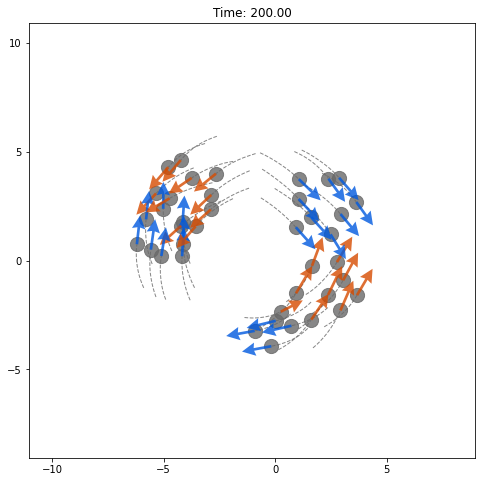

In [5]:
##### Plot the solution #####


import matplotlib.animation as animation

solution_plot=np.transpose(solution.y)

speed = 2
t_plot=np.arange(0,T+dt*speed ,dt*speed)
h = solution_plot[:,0:2*n]
velocity=solution_plot[:,2*n:4*n]

fig = plt.figure(figsize=(8, 8))
ax = plt.axes()

tail_length = 10

############################### order parameter #####################
velocity_x = velocity[:,0:n]
velocity_y = velocity[:,n:]
center_x = np.mean(h[:,0:n],axis=1,keepdims=True)
center_y = np.mean(h[:,n:],axis=1,keepdims=True)
r_x, r_y = h[:,0:n]-center_x, h[:,n:]-center_y

r_mag = np.sqrt(np.square(r_x)+np.square(r_y))
vel_mag=np.sqrt(np.square(velocity_x)+np.square(velocity_y)) #N X V
vel_mag_sum=np.sum(vel_mag, axis=1)

vel_x_sum = np.sum(velocity_x, axis=1)
vel_y_sum = np.sum(velocity_y, axis=1)

vel_vec_mag = np.sqrt(np.square(vel_x_sum)+np.square(vel_y_sum)) # abs(sum of velocity vector)

order_para = vel_vec_mag/vel_mag_sum

ang_mom = r_x*velocity_y - r_y * velocity_x

denom = np.sum(r_mag*vel_mag, axis=1)
ang_mom_sum = np.abs(np.sum(r_x*velocity_y - r_y * velocity_x, axis=1))
ang_mom_abs = np.sum(np.abs(r_x*velocity_y - r_y * velocity_x), axis=1)

order_para_rot = ang_mom_sum/denom
order_para_rot_abs = ang_mom_abs/denom

##########################################################################
init_color = np.array([0.,0.,0.])
cw_color =  np.array([0.,100.,250.])
ccw_color =  np.array([240.,84.,0.])
flock_color = np.array([145.,84.,192.])
agent_color = np.array([105./255,105./255,105./255,0.8])

        
def animate(i):
    window = 10
    ax.clear()
    plt.scatter(h[i*speed,0:n],h[i*speed,n:], color=agent_color, s=200, zorder=0)
    for j in range(n):
        ax.plot(h[i*speed - tail_length:i*speed+1,j],h[i*speed- tail_length:i*speed+1,n+j], '--', c=agent_color, lw=1, ms=1)
    
    rot_color = []
    for ii in range(len(ang_mom[i*speed,:])):
        if ang_mom[i*speed,ii]>0 and order_para_rot_abs[i*speed]>0.7:
            rot_color.append(np.append(ccw_color*(order_para_rot_abs[i*speed]-0.7)/0.3/255, [0.8]))
        elif ang_mom[i*speed,ii]<0 and order_para_rot_abs[i*speed]>0.7:
            rot_color.append(np.append(cw_color*(order_para_rot_abs[i*speed]-0.7)/0.3/255, [0.8]))
        else:
            rot_color.append(np.append(init_color,[0.8]))
    
    origin=np.array([h[i*speed,0:n], h[i*speed,n:]])
    plt.quiver(*origin, velocity[i*speed,0:n], velocity[i*speed,n:], scale_units='xy', angles='xy', color=rot_color, \
               scale=1.5, width=0.006, headwidth=5,zorder=2)

    center_x_i = np.mean(h[i*speed,0:n])
    center_y_i = np.mean(h[i*speed,n:])
    
    ax.set_title('Time: {:.2f}'.format(t[i*speed]))
    ax.set_xticks(np.arange(-100, 100, 5))
    ax.set_yticks(np.arange(-100, 100, 5))
    ax.set_xlim(center_x_i - window, center_x_i +window)
    ax.set_ylim(center_y_i - window, center_y_i +window)

anim = animation.FuncAnimation(fig, animate, frames=len(t_plot))
# FFwriter = animation.FFMpegWriter() ### Please install codec ###

from IPython.display import HTML
HTML(anim.to_html5_video())